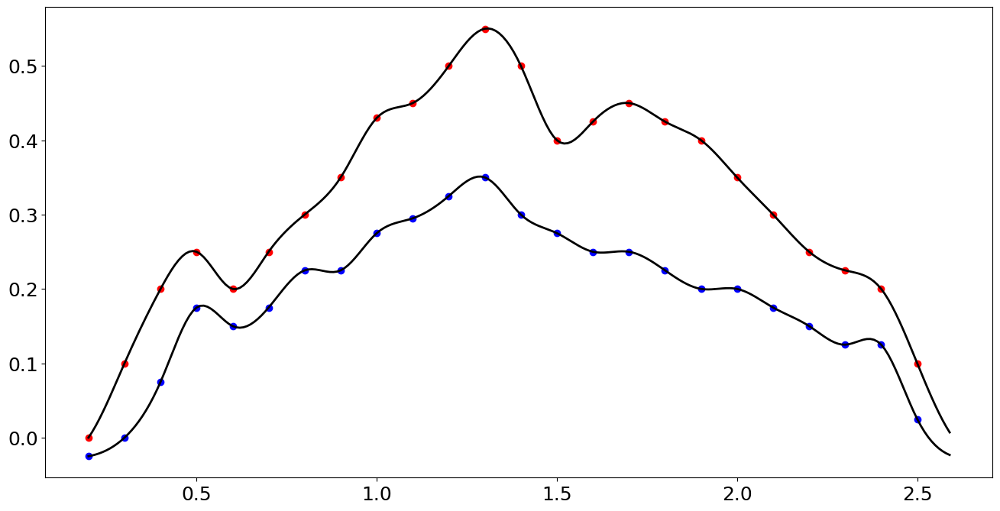

In [35]:
# CH02_SEC01_0_InnerProduct
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams.update({'font.size':18})

f = np.array([0, 0, .1, .2, .25, .2, .25, .3, .35, .43, .45, .5, .55, .5, .4, .425, .45, .425, .4, .35, .3, .25, .225, .2, .1, 0, 0])
g = np.array([0, 0, .025, .1, .2, .175, .2, .25, .25, .3, .32, .35, .375, .325, .3, .275, .275, .25, .225, .225, .2, .175, .15, .15, .05, 0, 0])
g = g - 0.025*np.ones_like(g)


x = 0.1*np.arange(1,len(f)+1)
xf = np.arange(0.1,x[-1],0.01)

f_interp = interpolate.interp1d(x, f, kind = 'cubic')
g_interp = interpolate.interp1d(x, g, kind = 'cubic')

ff = f_interp(xf)
gf = g_interp(xf)



plt.plot(x[1:-2],f[1:-2],'o', color = 'r')
plt.plot(x[1:-2],g[1:-2],'o', color = 'b')
plt.plot(xf[10:-10], ff[10:-10],color = 'k', linewidth = 2)
plt.plot(xf[10:-10], gf[10:-10],color = 'k', linewidth = 2)


plt.show()


C:\Users\simit\AppData\Local\Temp\ipykernel_6264\2546821127.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('tab10')


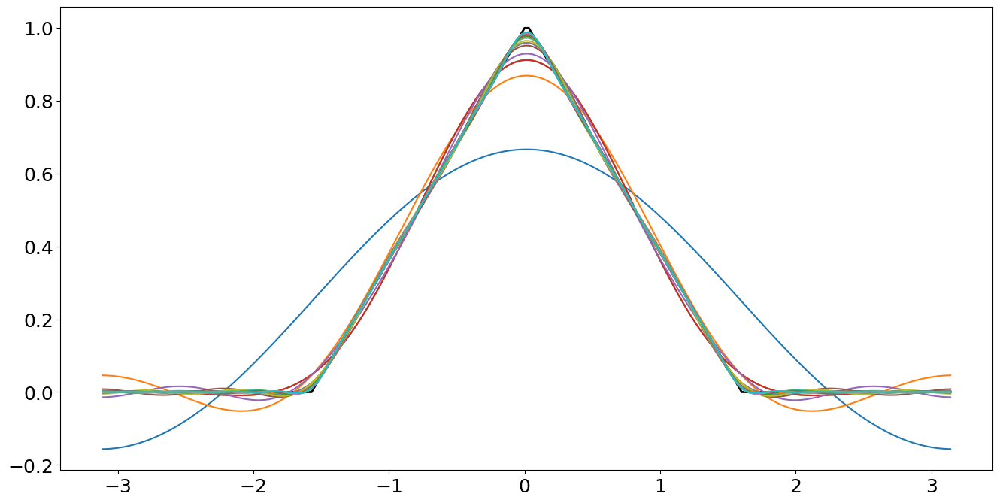

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams.update({'font.size':18})

# defining domain
dx = 0.01
L = np.pi
x = L*np.arange(-1+dx,1+dx,dx)
n = len(x)
nquart = int(np.floor(n/4))

# defining hat function
f = np.zeros_like(x)
f[nquart:2*nquart] = (4/n)*np.arange(1,nquart+1)
f[2*nquart:3*nquart] = np.ones(nquart) - (4/n)*np.arange(0,nquart)

# plotting the figure
fig, ax = plt.subplots()
ax.plot(x, f, '-k', linewidth = 2)

#computing the fourier series
name = "Accent"
cmap = get_cmap('tab10')
colors = cmap.colors
ax.set_prop_cycle(color = colors)


A0 = np.sum(f*np.ones_like(x))*dx

fFs = A0/2

A = np.zeros(20)
B = np.zeros(20)
for k in range(20):
#    A[k] = (2/L)*np.sum(f*np.cos(2*np.pi*(k+1)*x/L))*dx
#    B[k] = (2/L)*np.sum(f*np.sin(2*np.pi*(k+1)*x/L))*dx
#    fFs = fFs + A[k]*np.cos(2*np.pi*(k+1)*x/L) + B[k]*np.sin(2*np.pi*k*x/L)
#    ax.plot(x,fFs,'-')
    A[k] = np.sum(f*np.cos(np.pi*(k+1)*x/L))*dx
    B[k] = np.sum(f*np.sin(np.pi*(k+1)*x/L))*dx
    fFs = fFs + A[k]*np.cos(np.pi*(k+1)*x/L) + B[k]*np.sin(np.pi*(k+1)*x/L)
    ax.plot(x,fFs,'-')

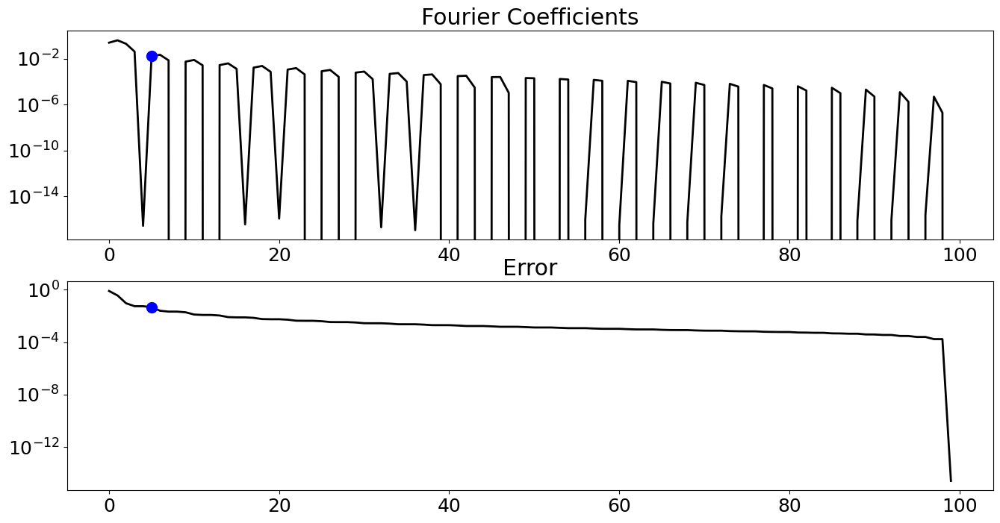

In [64]:
# plotting amplitudes and error
fFs = A0/2*np.ones_like(f)

kmax = 100
A = np.zeros(kmax)
B = np.zeros(kmax)
ERR = np.zeros(kmax)

A[0] = A0/2
ERR[0] = np.linalg.norm(f-fFs)/np.linalg.norm(f)

for k in range(1,kmax):
    A[k] = np.sum(f*np.cos(np.pi*k*x/L))*dx
    B[k] = np.sum(f*np.sin(np.pi*k*x/L))*dx
    fFs = fFs + A[k]*np.cos(np.pi*k*x/L) + B[k]*np.sin(np.pi*k*x/L)
    ERR[k] = np.linalg.norm(f-fFs)/np.linalg.norm(f)
    
thresh = np.median(ERR) * np.sqrt(kmax) * (4/np.sqrt(3))
r = np.max(np.where(ERR>thresh))

fig, axs = plt.subplots(2,1)
axs[0].semilogy(np.arange(kmax),A,'k',linewidth = 2)
axs[0].semilogy(r,A[r],'ob', markersize = 10)
plt.sca(axs[0])
plt.title('Fourier Coefficients')


axs[1].semilogy(np.arange(kmax),ERR, color = 'k', linewidth = 2)
axs[1].semilogy(r,ERR[r],'ob',markersize = 10)
plt.sca(axs[1])
plt.title('Error')

plt.show()

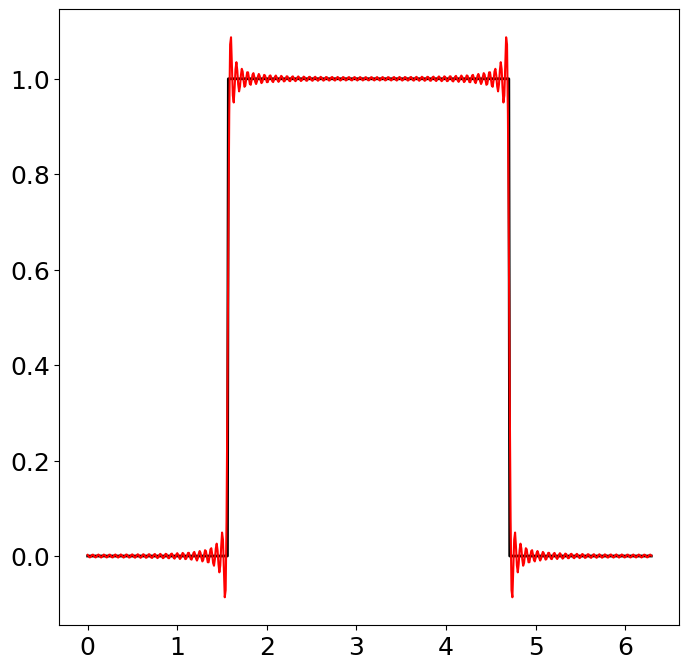

In [78]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams.update({'font.size': 18})

dx = 0.01
L = 2*np.pi
x = np.arange(0,L+dx,dx)
n = len(x)
nquart = int(np.floor(n/4))

f = np.zeros_like(x)
f[nquart:3*nquart] = 1

A0 = np.sum(f * np.ones_like(x)) * dx * 2 / L
fFS = A0/2 * np.ones_like(f)

for k in range(1,101):
    Ak = np.sum(f * np.cos(2*np.pi*k*x/L)) * dx * 2 / L
    Bk = np.sum(f * np.sin(2*np.pi*k*x/L)) * dx * 2 / L
    fFS = fFS + Ak*np.cos(2*k*np.pi*x/L) + Bk*np.sin(2*k*np.pi*x/L)
    
plt.plot(x,f,color='k',linewidth=2)
plt.plot(x,fFS,'-',color='r',linewidth=1.5)
plt.show()

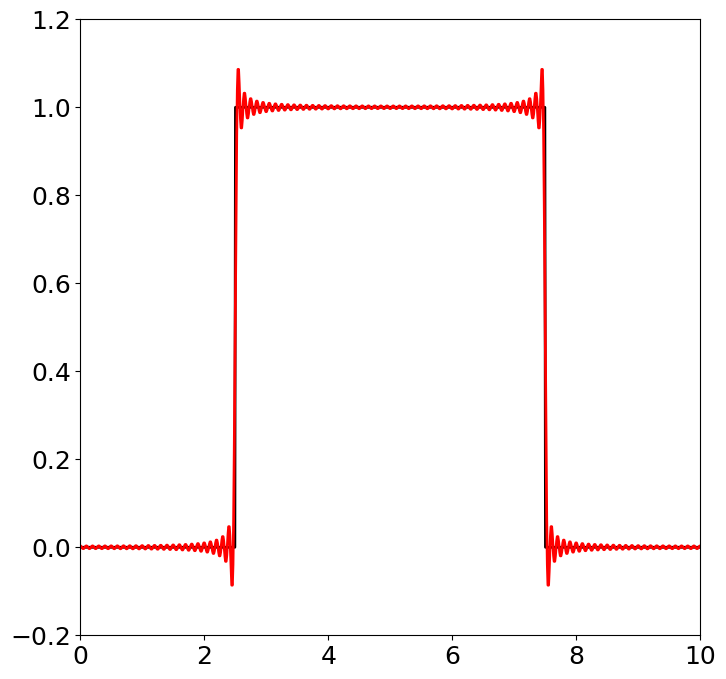

In [76]:
# Gibbs phenomenon
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML


plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams.update({'font.size': 18})
plt.rcParams['animation.html'] = 'jshtml'


dx = 0.01
L = 10
x = np.arange(0,L+dx,dx)
n = len(x)
nquart = int(np.floor(n/4))

f = np.zeros_like(x)
f[nquart:3*nquart] = 1

A0 = np.sum(f * np.ones_like(x)) * dx * 2 / L
fFS = A0/2 * np.ones_like(f)

fig,ax = plt.subplots()
plt.plot(x,f,color='k',linewidth=2)
fFS_plot, = plt.plot([],[],color='r',linewidth=2)

all_fFS = np.zeros((len(fFS),101))
all_fFS[:,0] = fFS

for k in range(1,101):
    Ak = np.sum(f * np.cos(2*np.pi*k*x/L)) * dx * 2 / L
    Bk = np.sum(f * np.sin(2*np.pi*k*x/L)) * dx * 2 / L
    fFS = fFS + Ak*np.cos(2*k*np.pi*x/L) + Bk*np.sin(2*k*np.pi*x/L)
    all_fFS[:,k] = fFS

def init():
    ax.set_xlim(x[0],x[-1])
    ax.set_ylim(-0.2, 1.2)
    return fFS

def animate(iter):
    fFS_plot.set_data(x,all_fFS[:,iter])
    return fFS_plot

anim = animation.FuncAnimation(fig,animate,init_func=init,frames=101,interval=50,blit=False,repeat=False)
HTML(anim.to_jshtml())

C:\Users\simit\AppData\Local\Temp\ipykernel_17216\104038505.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
  DFT[i,k] = w**(i*k)


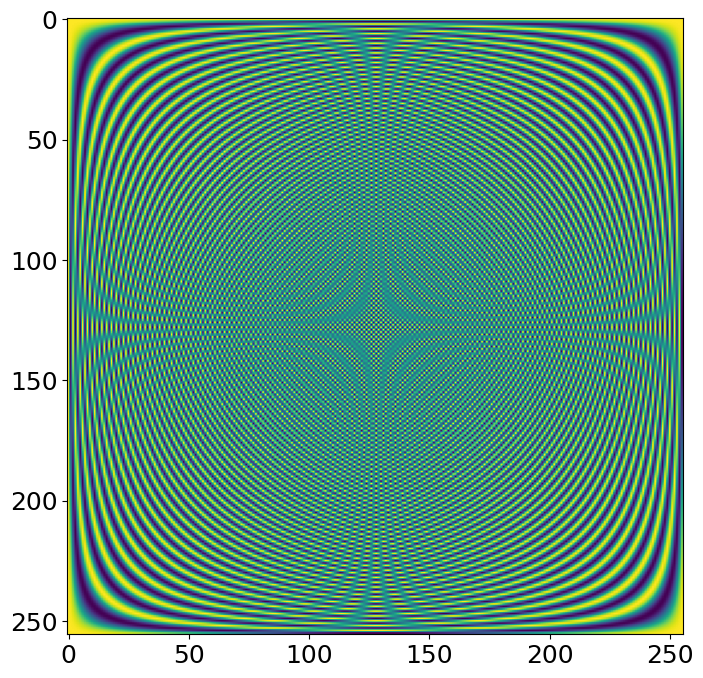

In [3]:
# Discrete Fourier Transforms

import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [16,8]
plt.rcParams.update({'font.size':18})

n = 256
w = np.exp(-2*np.pi*1j/n)


DFT = np.zeros((n,n))

# Slow method
for i in range(n):
    for k in range(n):
        DFT[i,k] = w**(i*k)

plt.imshow(DFT)
plt.show()

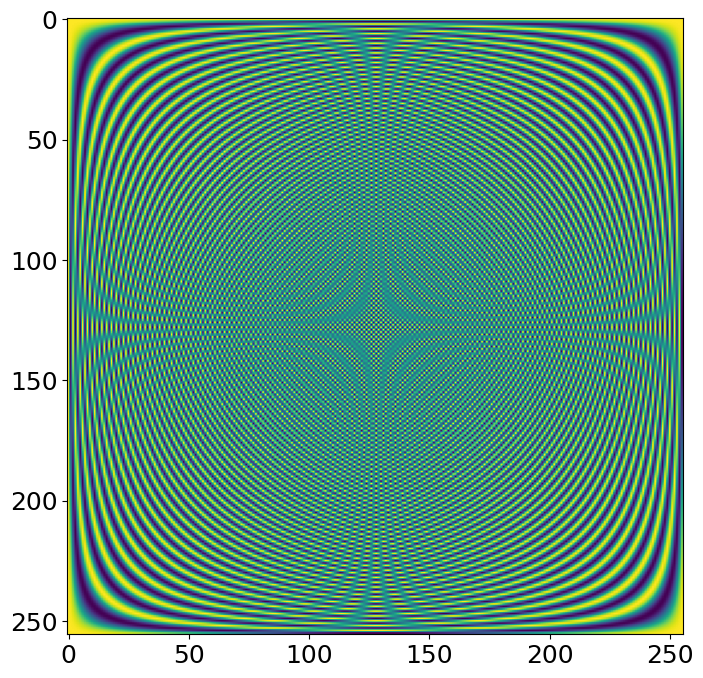

In [4]:
# Fast method

J,K = np.meshgrid(np.arange(n),np.arange(n))
DFT = np.power(w,J*K)

DFT = np.real(DFT)

plt.imshow(DFT)
plt.show()


In [11]:
# Denoising and extracting the signal

import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [16,8]
plt.rcParams.update({'font.size':18})


# Creating a simple signal with two frequencies
dt = 0.001
t = np.arange(0,1,dt)
f = np.sin(2*np.pi*50*t) + np.sin(2*np.pi*120*t)
fclean = f
# Adding noise
f = f + 2.5*np.random.randn(len(t))

In [12]:
# Computing the Fast Fourier Transform (FFT)

n = len(t)
fhat = np.fft.fft(f,n)
PSD = fhat*np.conj(fhat)/n
freq = (1/(dt*n))*np.arange(n)
L = np.arange(1,np.floor(n),dtype = 'int')

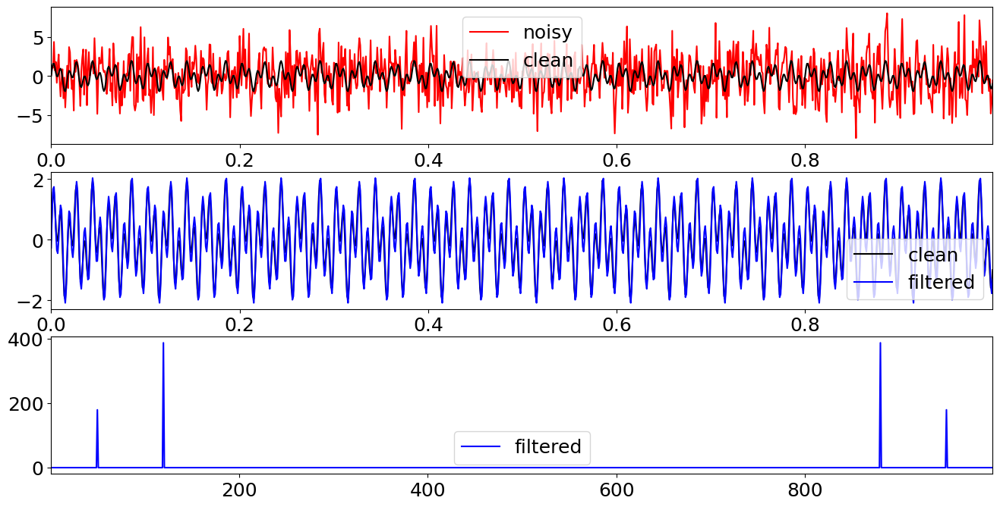

In [16]:
# Filtering the noise
indices = PSD>100
PSDclean = PSD*indices
fhat = fhat*indices
ffiltered = np.fft.ifft(fhat)

fig, ax = plt.subplots(3,1)

plt.sca(ax[0])
plt.plot(t,f,'r', linewidth = 1.5, label = 'noisy')
plt.plot(t,fclean,'k', linewidth = 1.5, label = 'clean')
plt.xlim(t[0],t[-1])
plt.legend()

plt.sca(ax[1])
plt.plot(t,fclean,'k', linewidth = 1.5, label = 'clean')
plt.plot(t,ffiltered,'b', linewidth = 1.5, label = 'filtered')
plt.xlim(t[0],t[-1])
plt.legend()

plt.sca(ax[2])
#plt.plot(freq[L], PSD[L], 'r', linewidth = 2, label = 'NOISY')
plt.plot(freq[L], PSDclean[L], 'b', linewidth = 1.5, label = 'filtered')
plt.xlim(freq[L[0]],freq[L[-1]])
plt.legend()

plt.show()

In [20]:
print((np.where(indices>0)))

(array([ 50, 120, 880, 950], dtype=int64),)


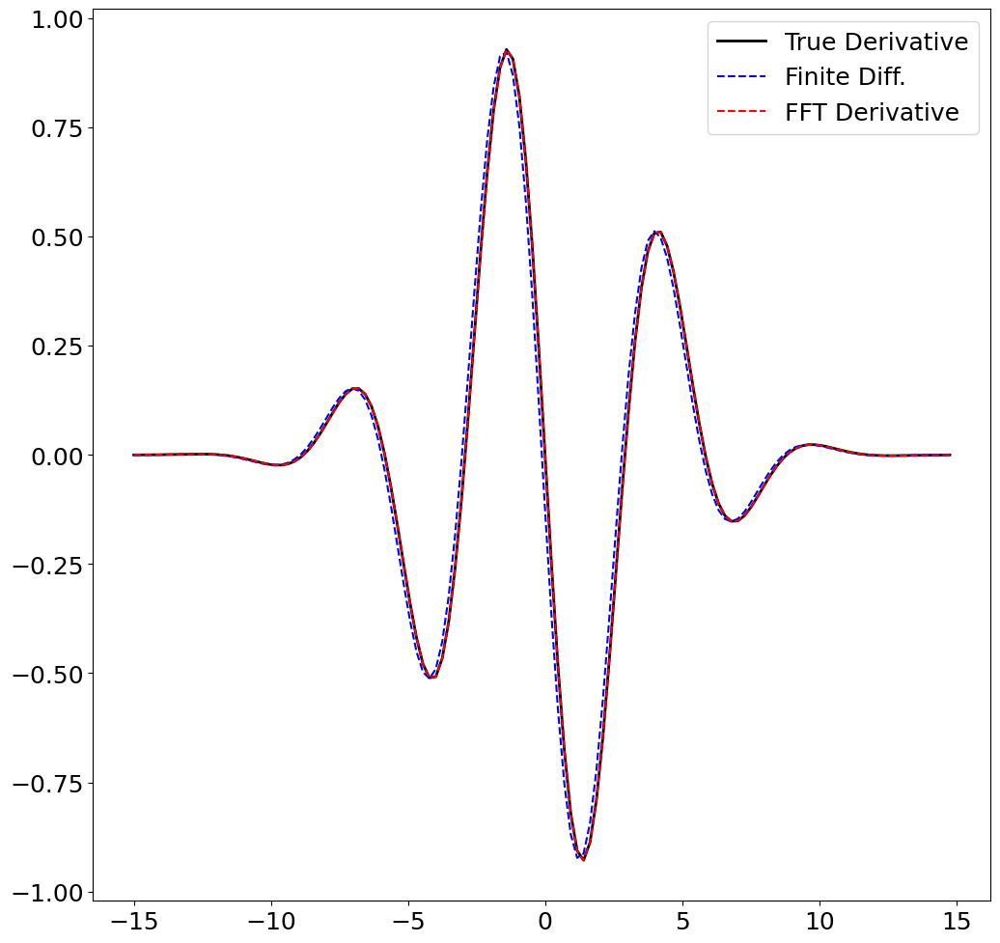

In [26]:
# Estimation of df/dx using finite diff vs fft

import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams.update({'font.size': 18})

n = 128
L = 30
dx = L/n
x = np.arange(-L/2,L/2,dx,dtype='complex_')
f = np.cos(x) * np.exp(-np.power(x,2)/25) # Function
df = -(np.sin(x) * np.exp(-np.power(x,2)/25) + (2/25)*x*f) # Derivative


# Approx derivative using finite difference
dfFD = np.zeros(len(df), dtype='complex_')
for kappa in range(len(df)-1):
    dfFD[kappa] = (f[kappa+1] - f[kappa])/dx

dfFD[-1] = dfFD[-2]


# Derivative using FFT
fhat = np.fft.fft(f,n)
kappa = (2*np.pi/L)*np.arange(-n/2,n/2)
kappa = np.fft.fftshift(kappa)
dfhat = kappa*fhat*(1j)
dfFFT = np.real(np.fft.ifft(dfhat))


# Plots
plt.figure()
plt.plot(x,df.real,'k',linewidth=2,label='True Derivative')
plt.plot(x,dfFD.real,'--b',linewidth=1.5,label='Finite Diff.')
plt.plot(x,dfFFT.real,'--r',linewidth=1.5,label='FFT Derivative')
plt.legend()
plt.show()

(1000,)
(2000,)
(100, 1000)


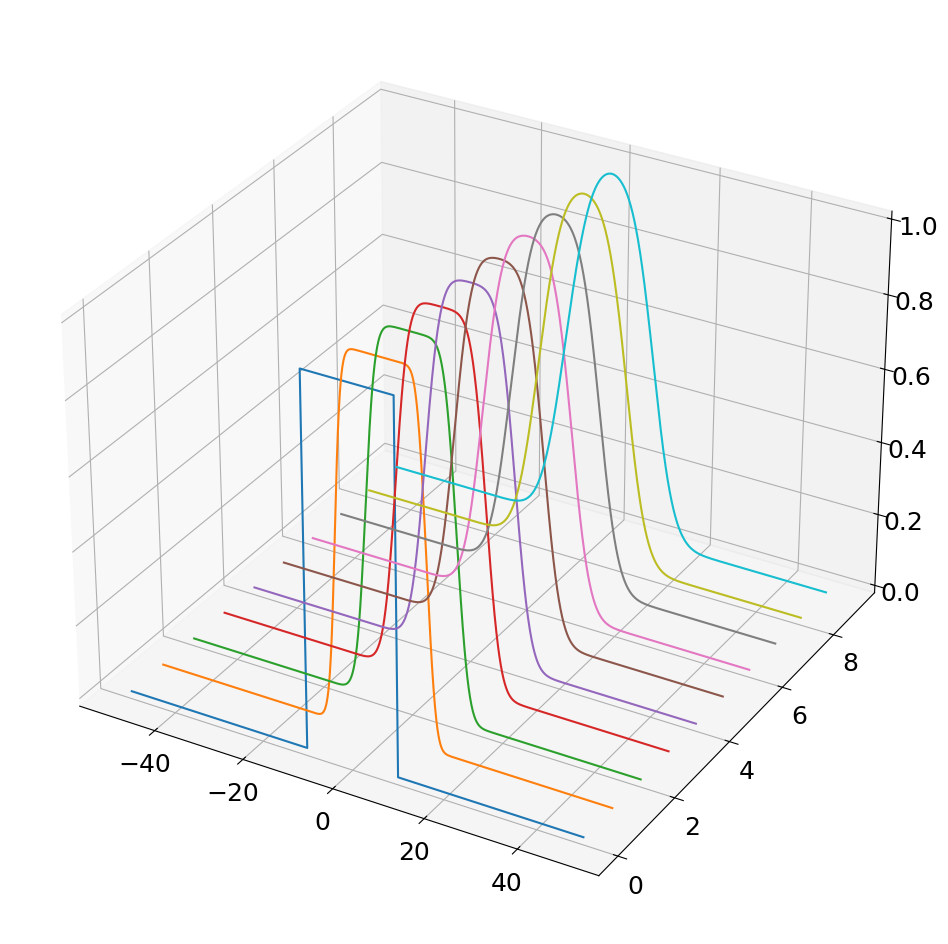

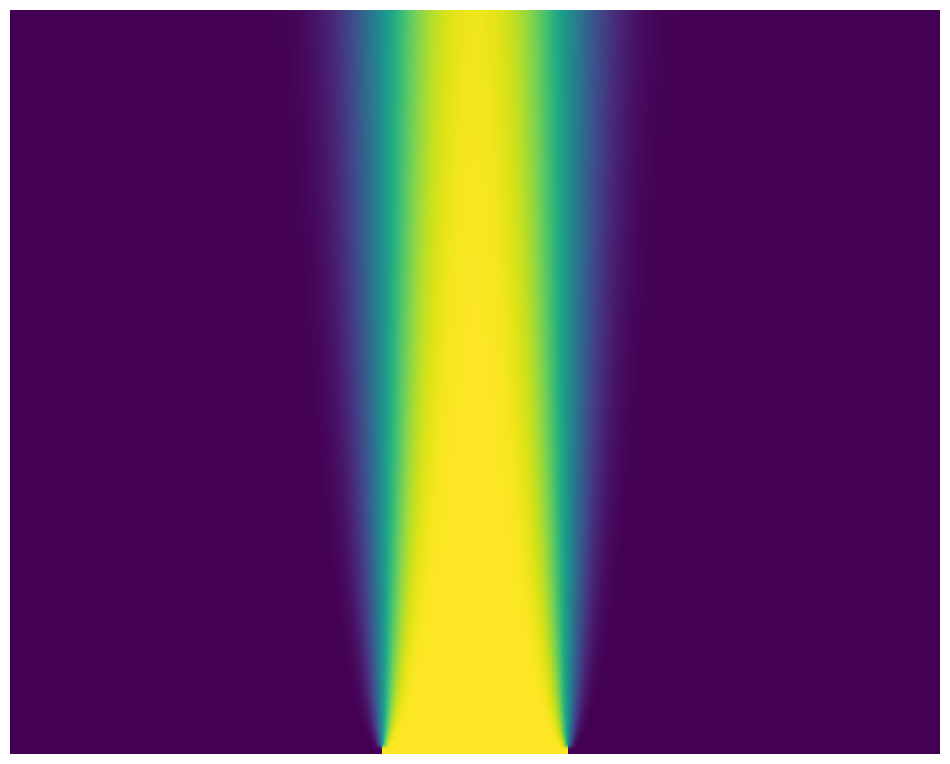

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from mpl_toolkits.mplot3d import axes3d

plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams.update({'font.size': 18})

a = 1    # Thermal diffusivity constant
L = 100  # Length of domain
N = 1000 # Number of discretization points
dx = L/N
x = np.arange(-L/2,L/2,dx) # Define x domain

# discrete wavenumbers
kappa = 2*np.pi*np.fft.fftfreq(N,d = dx)

# Initial condition
u0 = np.zeros_like(x)
u0[int((L/2 - L/10)/dx):int((L/2 + L/10)/dx)] = 1
u0hat = np.fft.fft(u0)

# SciPy's odeint function doesn't play well with complex numbers, so we recast 
# the state u0hat from an N-element complex vector to a 2N-element real vector
u0hat_ri = np.concatenate((u0hat.real,u0hat.imag))

# Simulate in Fourier frequency domain
dt = 0.1
t = np.arange(0,10,dt)

def rhsHeat(uhat_ri, t, kappa, a):
    uhat = uhat_ri[:N] + 1j*uhat_ri[N:]
    d_uhat = -a**2 * (np.power(kappa,2)) * uhat
    d_uhat_ri = np.concatenate((d_uhat.real, d_uhat.imag)).astype('float64')
    return d_uhat_ri

uhat_ri = odeint(rhsHeat, u0hat_ri, t, args = (kappa,a))


uhat = uhat_ri[:,:N] + 1j*uhat_ri[:,N:]

print(np.shape(u0hat))
print(np.shape(u0hat_ri))
print(np.shape(uhat))

u = np.zeros_like(uhat)

for k in range(len(t)):
    u[k,:] = np.fft.ifft(uhat[k,:])

u = u.real

# Waterfall plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

u_plot = u[0:-1:10,:]
for j in range(u_plot.shape[0]):
    ys = j*np.ones(u_plot.shape[1])
    ax.plot(x,ys,u_plot[j,:])
    
# Image plot
plt.figure()
plt.imshow(np.flipud(u), aspect=8)
plt.axis('off')
plt.show()


In [45]:
a = np.arange(10)


print(a)
print(a[:5])
print(a[:-1])
print(a[0:-1])
print(a[0:-1:2])
print(a[0:-1:3])


[0 1 2 3 4 5 6 7 8 9]
[0 1 2 3 4]
[0 1 2 3 4 5 6 7 8]
[0 1 2 3 4 5 6 7 8]
[0 2 4 6 8]
[0 3 6]


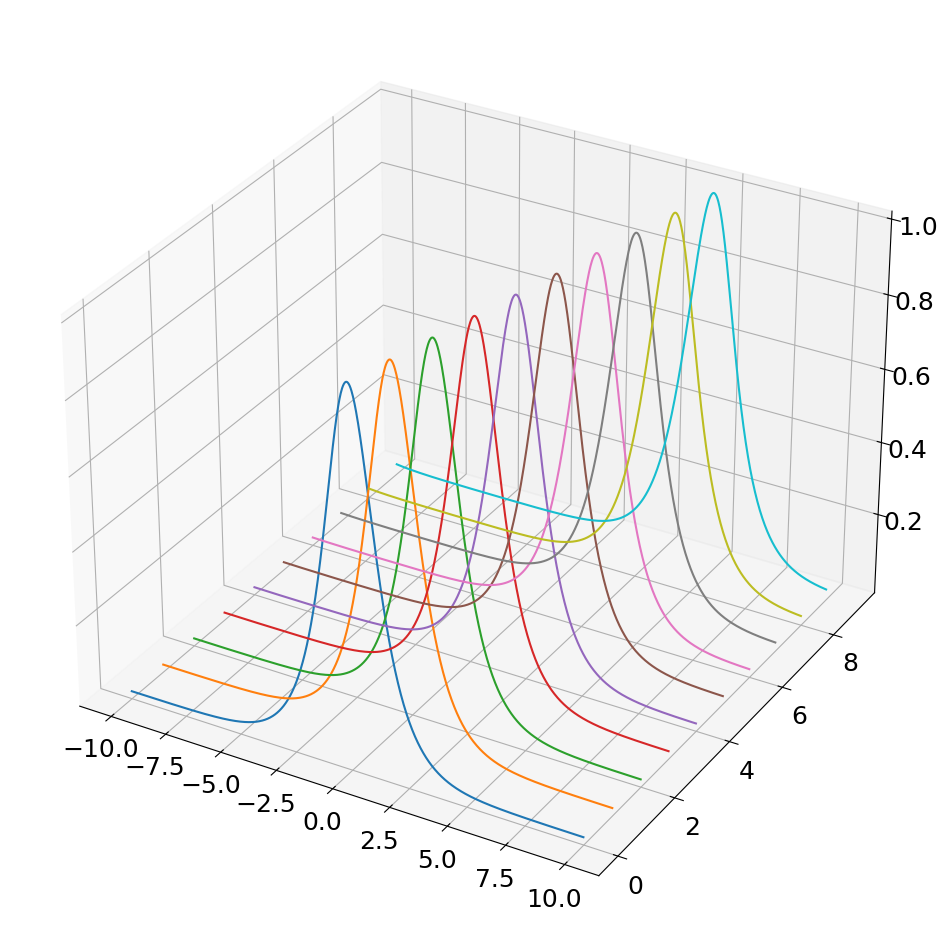

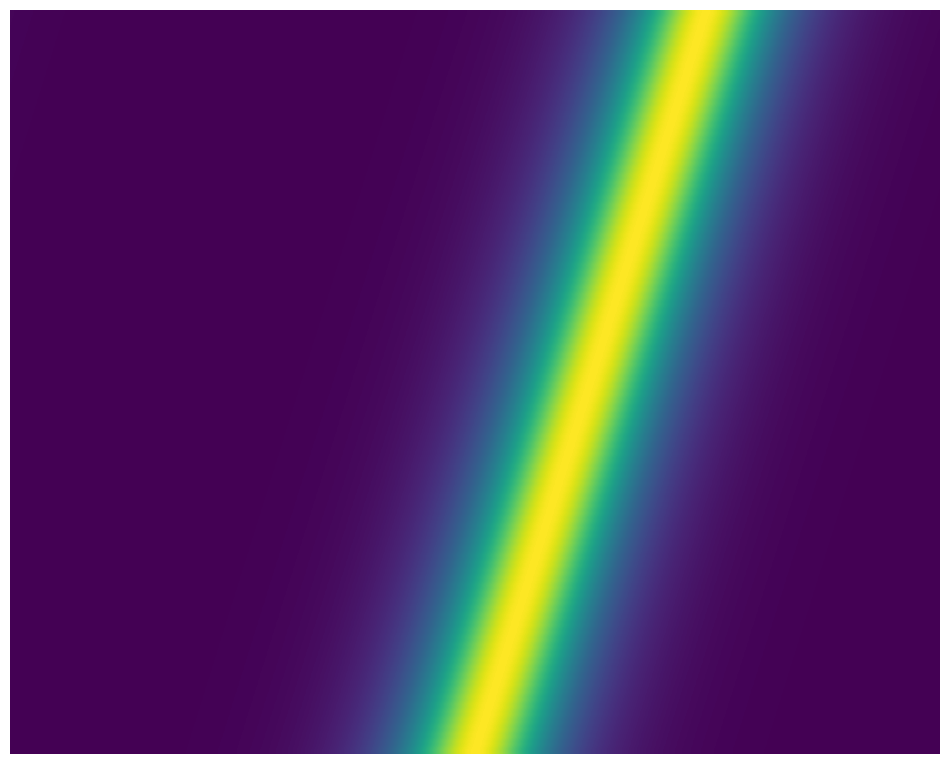

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from mpl_toolkits.mplot3d import axes3d
plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams.update({'font.size': 18})

c = 2    # Wave speed
L = 20   # Length of domain
N = 1000 # Number of discretization points
dx = L/N
x = np.arange(-L/2,L/2,dx) # Define x domain

# Define discrete wavenumbers
kappa = 2*np.pi*np.fft.fftfreq(N, d=dx)

# Initial condition
u0 = 1/np.cosh(x)
u0hat = np.fft.fft(u0)

# SciPy's odeint function doesn't play well with complex numbers, so we recast 
# the state u0hat from an N-element complex vector to a 2N-element real vector
u0hat_ri = np.concatenate((u0hat.real,u0hat.imag))

# Simulate in Fourier frequency domain
dt = 0.025
t = np.arange(0,100*dt,dt)

def rhsWave(uhat_ri,t,kappa,c):
    uhat = uhat_ri[:N] + (1j) * uhat_ri[N:]
    d_uhat = -c*(1j)*kappa*uhat
    d_uhat_ri = np.concatenate((d_uhat.real,d_uhat.imag)).astype('float64')
    return d_uhat_ri

uhat_ri = odeint(rhsWave, u0hat_ri, t, args=(kappa,c))
uhat = uhat_ri[:,:N] + (1j) * uhat_ri[:,N:]

# Alternatively, simulate in spatial domain
def rhsWaveSpatial(u,t,kappa,c):
    uhat = np.fft.fft(u)
    d_uhat = (1j)*kappa*uhat
    d_u = np.fft.ifft(d_uhat).real
    du_dt = -c*d_u
    return du_dt

u = odeint(rhsWaveSpatial,u0,t,args=(kappa,c))

# Inverse FFT to bring back to spatial domain
u = np.zeros_like(uhat)

for k in range(len(t)):
    u[k,:] = np.fft.ifft(uhat[k,:])

u = u.real   


# Waterfall plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

u_plot = u[0:-1:10,:]
for j in range(u_plot.shape[0]):
    ys = j*np.ones(u_plot.shape[1])
    ax.plot(x,ys,u_plot[j,:])
    
# Image plot
plt.figure()
plt.imshow(np.flipud(u), aspect=8)
plt.axis('off')
plt.show()

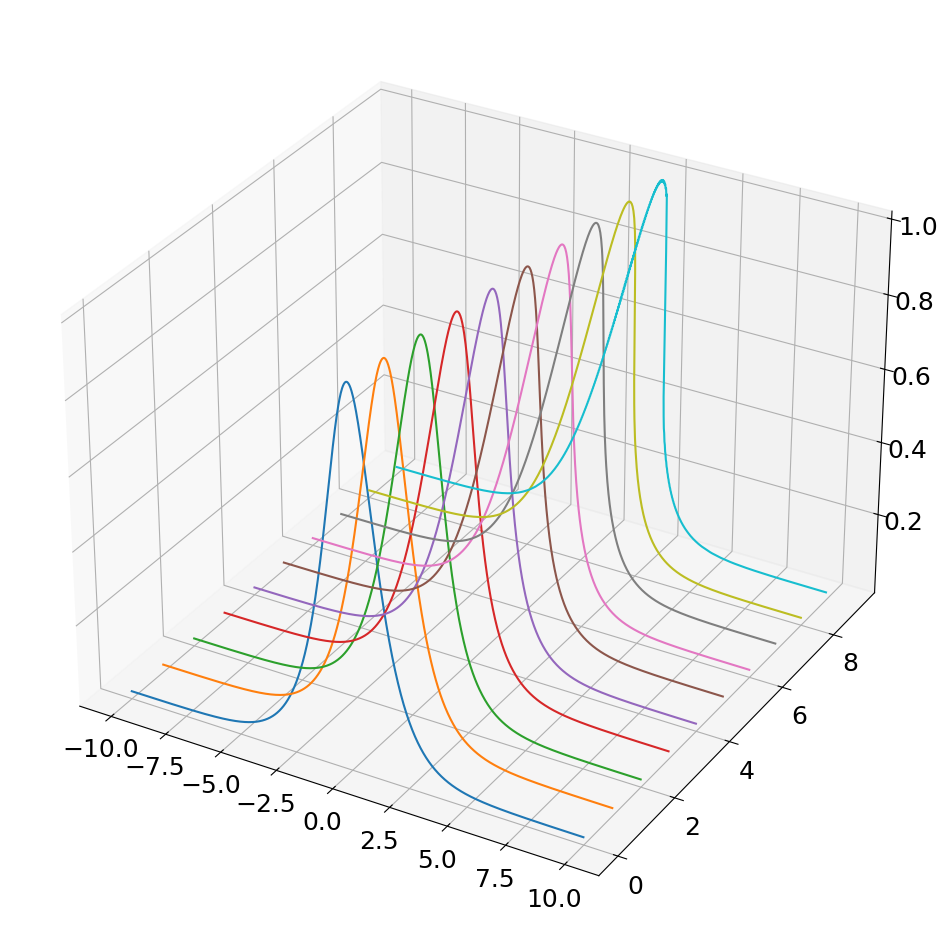

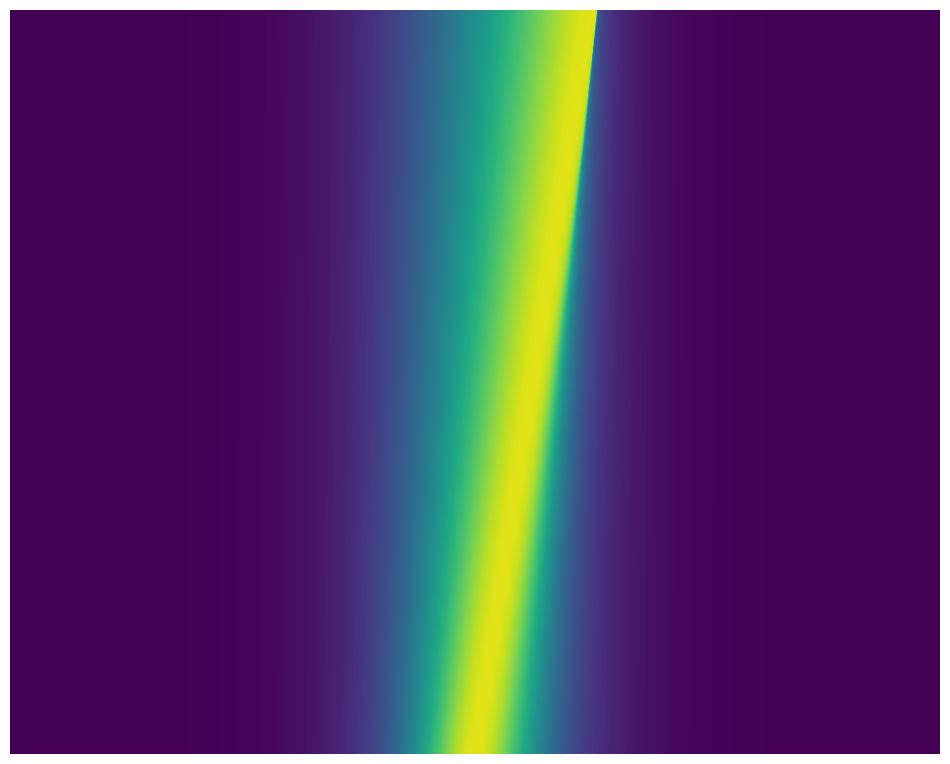

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from mpl_toolkits.mplot3d import axes3d
plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams.update({'font.size': 18})

nu = 0.001 # Diffusion constant
L = 20     # Length of domain
N = 1000   # Number of discretization points
dx = L/N
x = np.arange(-L/2,L/2,dx) # Define x domain

# Define discrete wavenumbers
kappa = 2*np.pi*np.fft.fftfreq(N, d=dx)

# Initial condition
u0 = 1/np.cosh(x)

# Simulate PDE in spatial domain
dt = 0.025
t = np.arange(0,100*dt,dt)

def rhsBurgers(u,t,kappa,nu):
    uhat = np.fft.fft(u)
    d_uhat = (1j)*kappa*uhat
    dd_uhat = -np.power(kappa,2)*uhat
    d_u = np.fft.ifft(d_uhat)
    dd_u = np.fft.ifft(dd_uhat)
    du_dt = -u * d_u + nu*dd_u
    return du_dt.real

u = odeint(rhsBurgers,u0,t,args=(kappa,nu))

# Waterfall plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

u_plot = u[0:-1:10,:]
for j in range(u_plot.shape[0]):
    ys = j*np.ones(u_plot.shape[1])
    ax.plot(x,ys,u_plot[j,:])
    
# Image plot
plt.figure()
plt.imshow(np.flipud(u), aspect=8)
plt.axis('off')
plt.show()

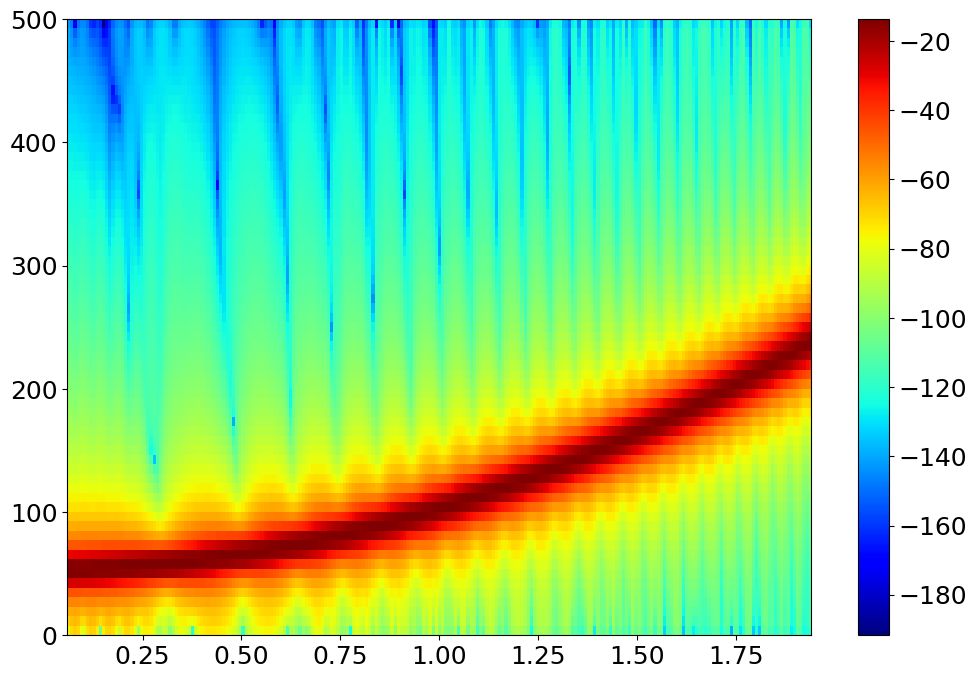

In [49]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams.update({'font.size': 18})

dt = 0.001
t = np.arange(0,2,dt)
f0 = 50
f1 = 250
t1 = 2
x = np.cos(2*np.pi*t*(f0 + (f1-f0)*np.power(t,2)/(3*t1**2)))

plt.specgram(x, NFFT=128, Fs=1/dt, noverlap=120,cmap='jet')
plt.colorbar()
plt.show()

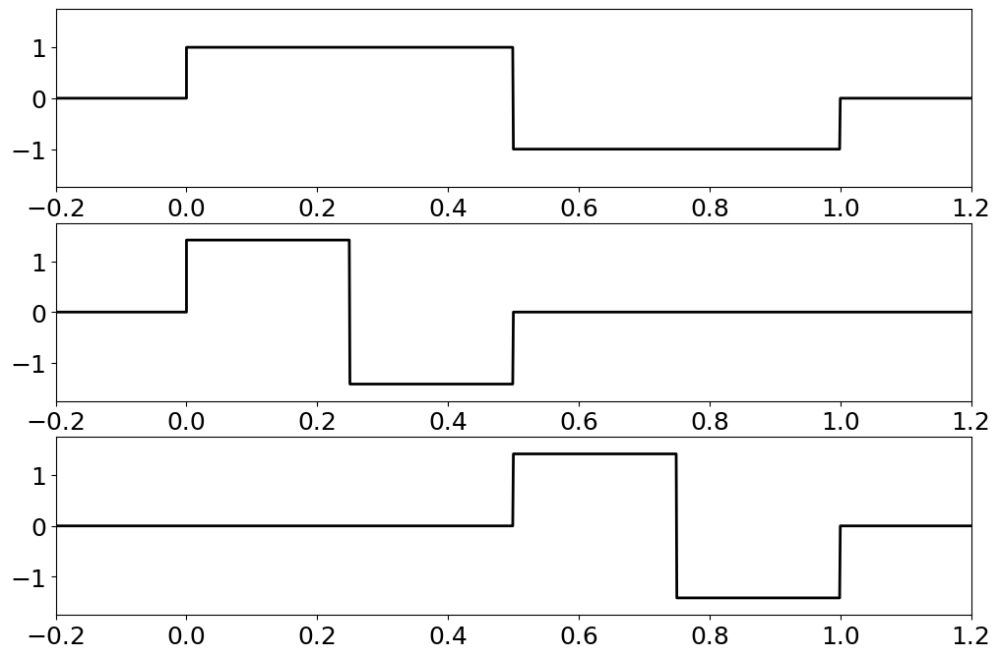

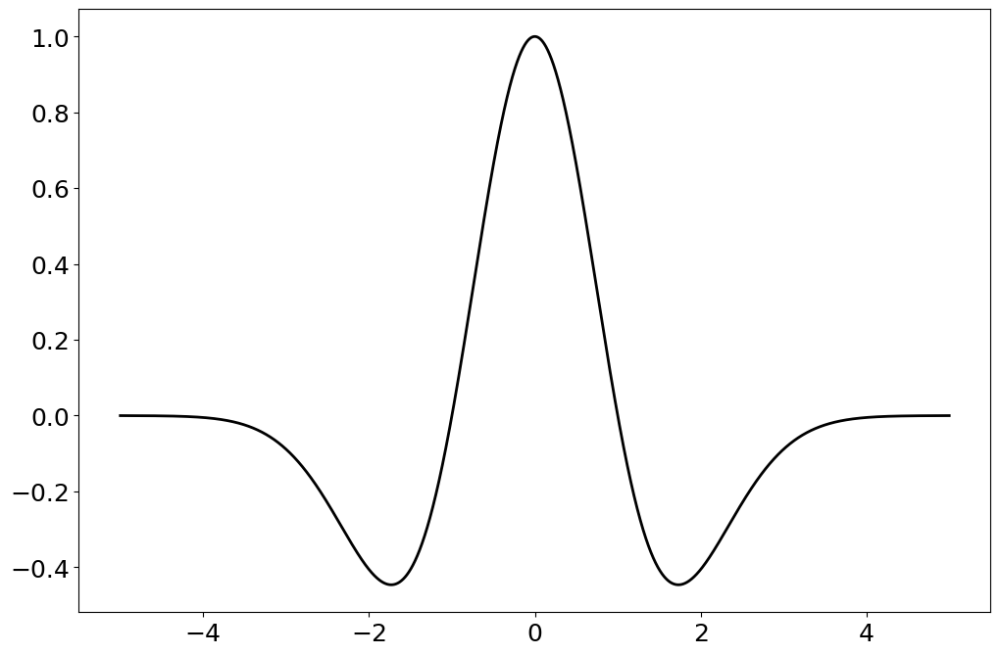

In [51]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams.update({'font.size': 18})


x = np.arange(0,1,0.001)
n = len(x)
n2 = int(np.floor(n/2))
n4 = int(np.floor(n/4))

f10 = np.zeros_like(x)
f10[:n2] = 1
f10[n2:] = -1

f21 = np.zeros_like(x)
f21[:n4] = 1
f21[n4:n2] = -1
f21 = f21 * np.sqrt(2)

f22 = np.zeros_like(x)
f22[n2:(n2+n4)] = 1
f22[(n2+n4):] = -1
f22 = f22 * np.sqrt(2)

# x = np.concatenate((-1, 0, x, 1, 2))
x = np.append([-1,0],x)
x = np.append(x,[1,2])

f10 = np.pad(f10, (2, 2), 'constant')
f21 = np.pad(f21, (2, 2), 'constant')
f22 = np.pad(f22, (2, 2), 'constant')

fig,axs = plt.subplots(3,1)
axs[0].plot(x,f10,color='k',linewidth=2)
axs[0].set_xlim(-0.2,1.2)
axs[0].set_ylim(-1.75,1.75)
axs[1].plot(x,f21,color='k',linewidth=2)
axs[1].set_xlim(-0.2,1.2)
axs[1].set_ylim(-1.75,1.75)
axs[2].plot(x,f22,color='k',linewidth=2)
axs[2].set_xlim(-0.2,1.2)
axs[2].set_ylim(-1.75,1.75)
plt.show()

x = np.arange(-5,5,0.001)
fMexHat = (1-np.power(x,2)) * np.exp(-np.power(x,2)/2)
plt.plot(x,fMexHat,color='k',linewidth=2)
plt.show()

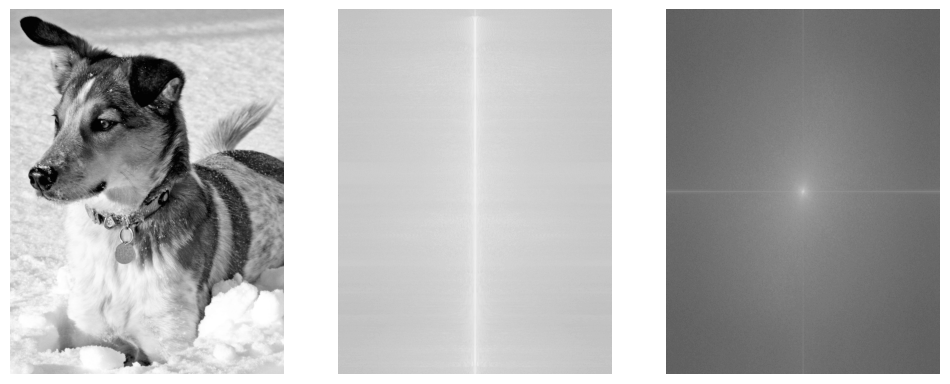

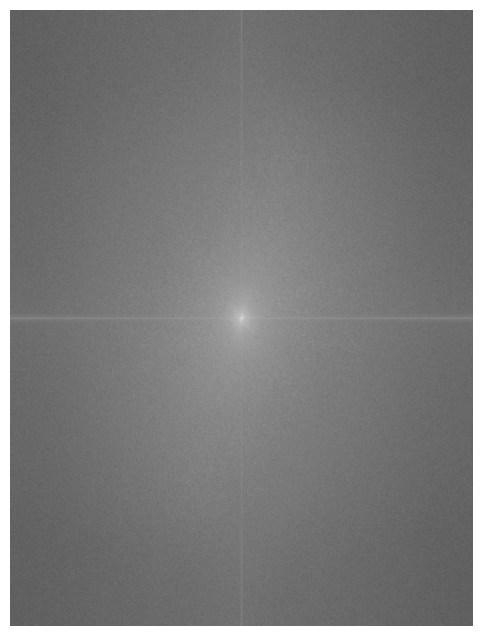

In [58]:
from matplotlib.image import imread
import numpy as np 
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams.update({'font.size': 18})

A = imread("DATA/dog.jpg")
B = np.mean(A,-1) # converting to gray scale

fig, axs = plt.subplots(1,3)

#plot image
img = axs[0].imshow(B)
img.set_cmap('gray')
axs[0].axis('off')

#compute row-wise fft

Cshift = np.zeros_like(B, dtype='complex_')
C = np.zeros_like(B,dtype='complex_')

for j in range(B.shape[0]):
    Cshift[j,:] = np.fft.fftshift(np.fft.fft(B[j,:]))
    C[j,:] = np.fft.fft(B[j,:])
    

img = axs[1].imshow(np.log(np.abs(Cshift)))
img.set_cmap('gray')
axs[1].axis('off')


# Compute column-wise FFT
D = np.zeros_like(C)
for j in range(C.shape[1]):
    D[:,j] = np.fft.fft(C[:,j])
    

img = axs[2].imshow(np.fft.fftshift(np.log(np.abs(D))))
img.set_cmap('gray')
axs[2].axis('off')

plt.show()

# Much more efficient to use fft2
D = np.fft.fft2(B)

plt.figure()
img = plt.imshow(np.fft.fftshift(np.log(np.abs(D))))
img.set_cmap('gray')
plt.axis('off')

plt.show()

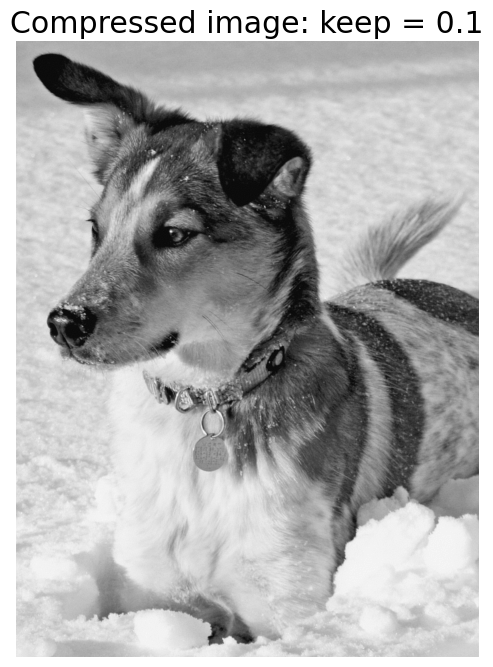

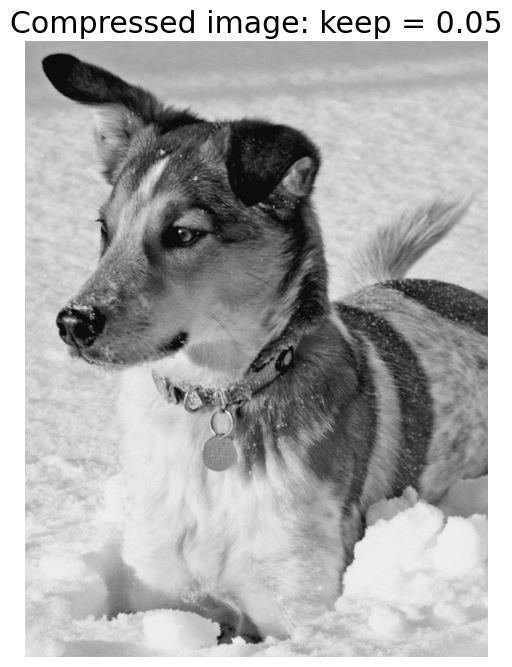

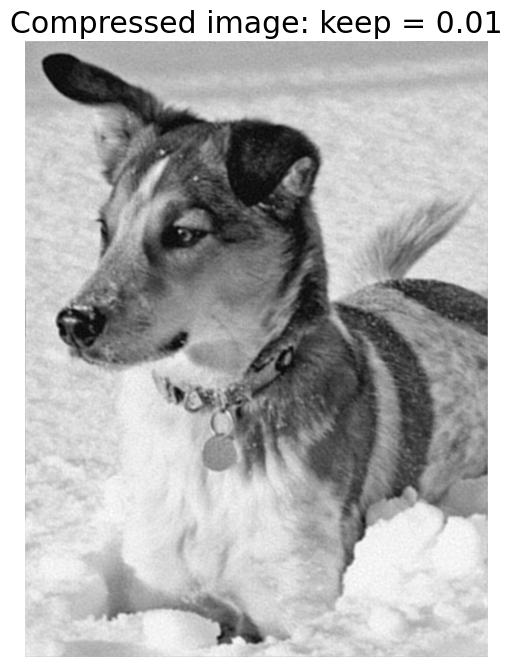

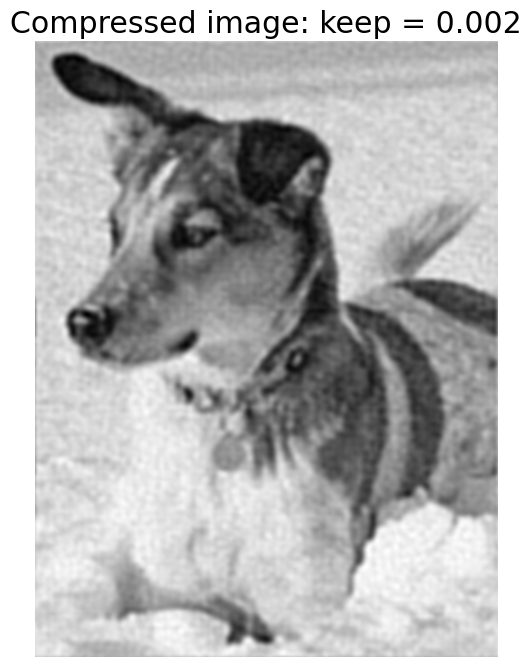

In [67]:
from matplotlib.image import imread
import numpy as np 
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams.update({'font.size': 18})

A = imread("DATA/dog.jpg")
B = np.mean(A,-1) # converting to gray scale

Bt = np.fft.fft2(B)
Btsort = np.sort(np.abs(Bt.reshape(-1)))# sorted in ascending order

# Zero out all small coefficients and inverse transform
for keep in (0.1, 0.05, 0.01, 0.002):
    thresh = Btsort[int(np.floor((1-keep)*len(Btsort)))]
    ind = np.abs(Bt)>thresh
    Atlow = Bt*ind
    Alow = np.fft.ifft2(Atlow).real
    plt.figure()
    plt.imshow(Alow,cmap='gray')
    plt.axis('off')
    plt.title('Compressed image: keep = ' + str(keep))   

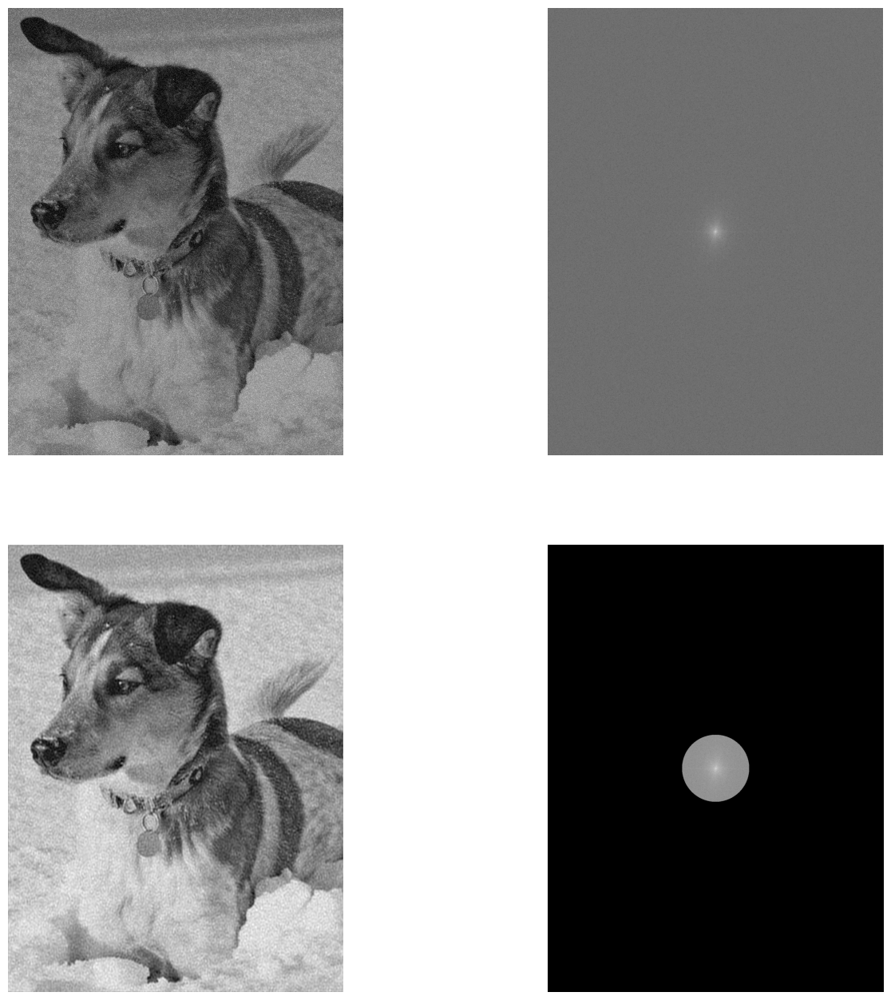

In [69]:
from matplotlib.image import imread
import numpy as np
import matplotlib.pyplot as plt
import os
plt.rcParams['figure.figsize'] = [16, 16]
plt.rcParams.update({'font.size': 18})

A = imread('DATA/dog.jpg')
B = np.mean(A, -1); # Convert RGB to grayscale

## Denoise
Bnoise = B + 200*np.random.randn(*B.shape).astype('uint8') # Add some noise
Bt = np.fft.fft2(Bnoise)
Btshift = np.fft.fftshift(Bt)
F = np.log(np.abs(Btshift)+1) # Put FFT on log scale

fig,axs = plt.subplots(2,2)

axs[0,0].imshow(Bnoise,cmap='gray')
axs[0,0].axis('off')

axs[0,1].imshow(F,cmap='gray')
axs[0,1].axis('off')

nx,ny = B.shape
X,Y = np.meshgrid(np.arange(-ny/2+1,ny/2+1),np.arange(-nx/2+1,nx/2+1))
# xgrid = np.fft.ifftshift(np.arange(-nx/2+1,nx/2+1))
# ygrid = np.fft.ifftshift(np.arange(-ny/2+1,ny/2+1))
# X,Y = np.meshgrid(ygrid,xgrid)
R2 = np.power(X,2) + np.power(Y,2)
ind = R2 < 150**2
Btshiftfilt = Btshift * ind
Ffilt = np.log(np.abs(Btshiftfilt)+1) # Put FFT on log scale

axs[1,1].imshow(Ffilt,cmap='gray')
axs[1,1].axis('off')

Btfilt = np.fft.ifftshift(Btshiftfilt)
Bfilt = np.fft.ifft2(Btfilt).real
axs[1,0].imshow(Bfilt,cmap='gray')
axs[1,0].axis('off')

plt.show()

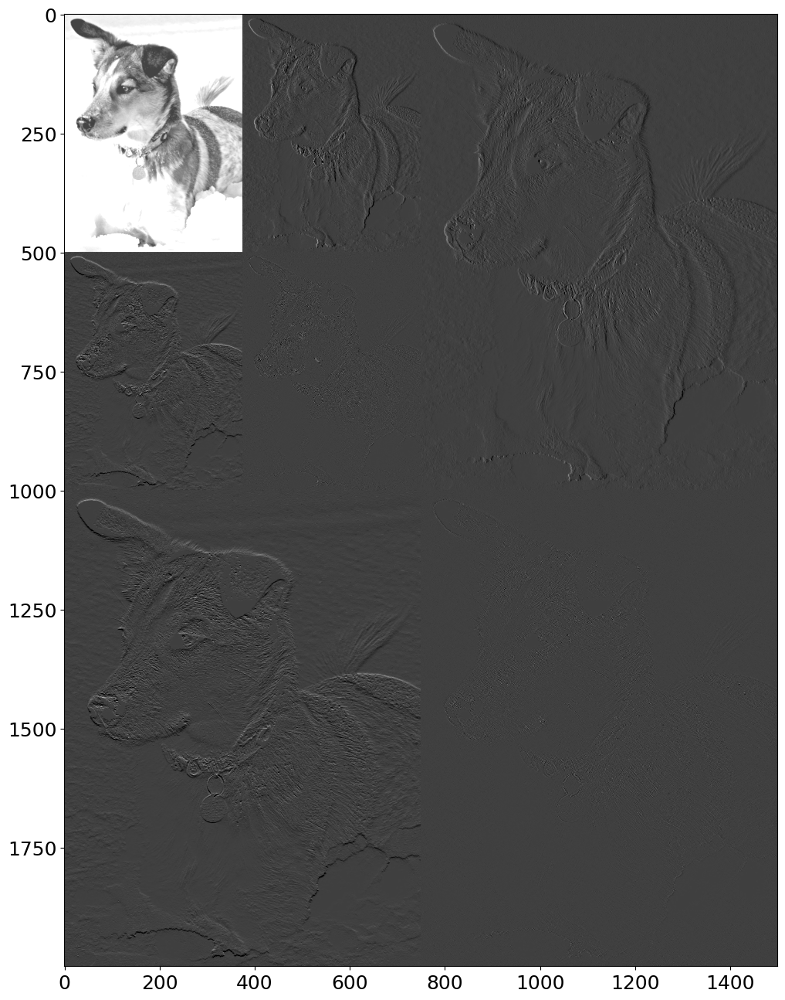

In [71]:
# Using the PyWavelets module, available at 
# https://pywavelets.readthedocs.io/en/latest/install.html

from matplotlib.image import imread
import numpy as np
import matplotlib.pyplot as plt
import os
import pywt
plt.rcParams['figure.figsize'] = [16, 16]
plt.rcParams.update({'font.size': 18})

A = imread('DATA/dog.jpg')
B = np.mean(A, -1); # Convert RGB to grayscale

## Wavelet decomposition (2 level)
n = 2
w = 'db1'
coeffs = pywt.wavedec2(B,wavelet=w,level=n)

# normalize each coefficient array
coeffs[0] /= np.abs(coeffs[0]).max()
for detail_level in range(n):
    coeffs[detail_level + 1] = [d/np.abs(d).max() for d in coeffs[detail_level + 1]]

arr, coeff_slices = pywt.coeffs_to_array(coeffs)



plt.imshow(arr,cmap='gray',vmin=-0.25,vmax=0.75)
plt.show()

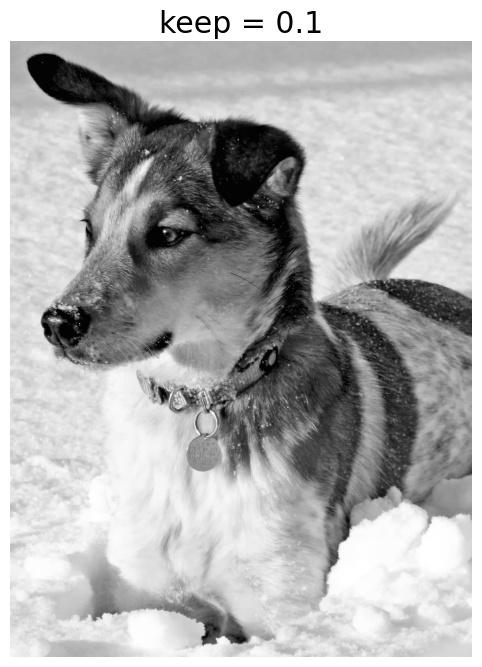

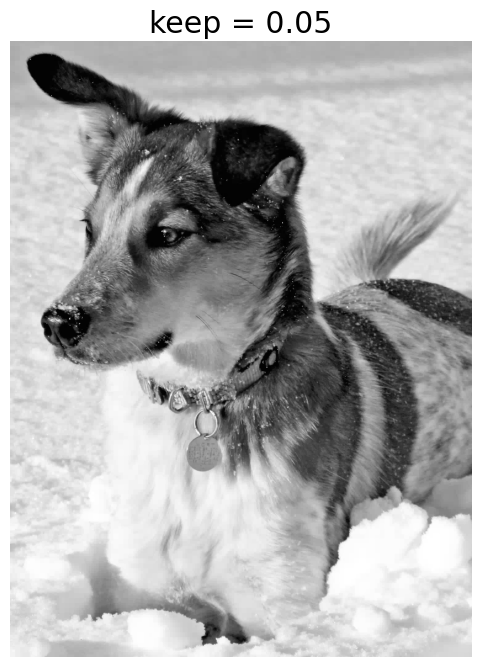

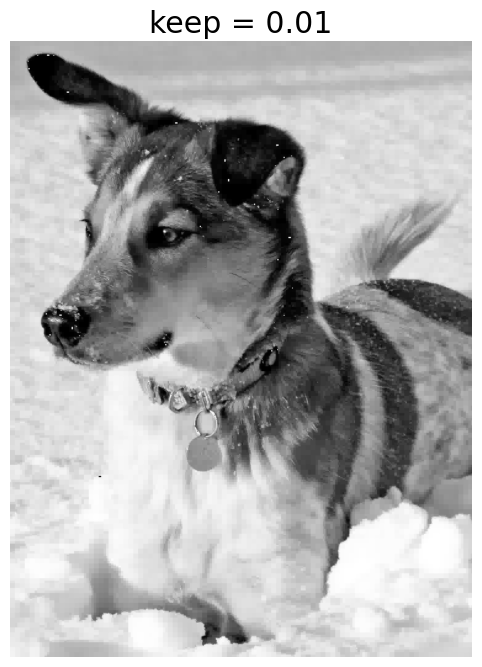

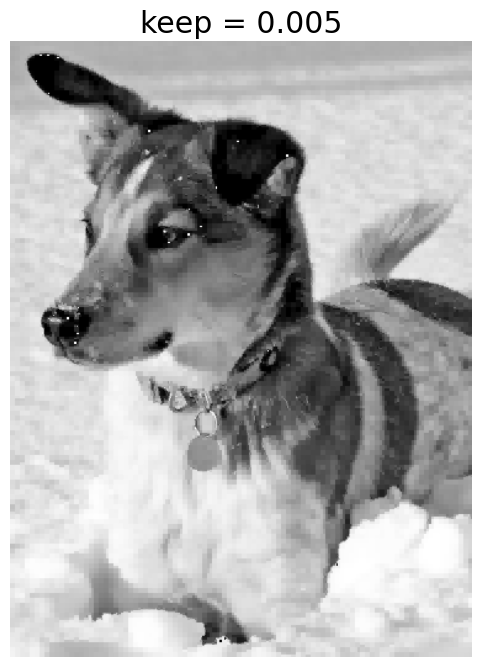

In [72]:
# Using the PyWavelets module, available at 
# https://pywavelets.readthedocs.io/en/latest/install.html

from matplotlib.image import imread
import numpy as np
import matplotlib.pyplot as plt
import os
import pywt
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams.update({'font.size': 18})

A = imread('DATA/dog.jpg')
B = np.mean(A, -1); # Convert RGB to grayscale


## Wavelet Compression
n = 4
w = 'db1'
coeffs = pywt.wavedec2(B,wavelet=w,level=n)

coeff_arr, coeff_slices = pywt.coeffs_to_array(coeffs)

Csort = np.sort(np.abs(coeff_arr.reshape(-1)))

for keep in (0.1, 0.05, 0.01, 0.005):
    thresh = Csort[int(np.floor((1-keep)*len(Csort)))]
    ind = np.abs(coeff_arr) > thresh
    Cfilt = coeff_arr * ind # Threshold small indices
    
    coeffs_filt = pywt.array_to_coeffs(Cfilt,coeff_slices,output_format='wavedec2')
    
    # Plot reconstruction
    Arecon = pywt.waverec2(coeffs_filt,wavelet=w)
    plt.figure()
    plt.imshow(Arecon.astype('uint8'),cmap='gray')
    plt.axis('off')
    plt.title('keep = ' + str(keep))
